NaN values found in 'edges' DataFrame:
Column: vi Room Name, Rows: [2793, 2794, 2795, 2796, 2797, 2798, 2799, 2800, 2801, 2802, 2803, 2804, 2805, 2806, 2807, 2808, 2809, 2810, 2811, 2812, 2813, 2814, 2815, 2816]
Column: vj Room Name, Rows: [31, 2793, 2794, 2795, 2796, 2797, 2798, 2799, 2800, 2801, 2802, 2803, 2804, 2805, 2806, 2807, 2808, 2809, 2810, 2811, 2812, 2813, 2814, 2815, 2816]
Column: Wall Unique ID, Rows: [1624, 1625, 1626, 1627, 1628, 1629, 1630, 1631, 1632, 1633, 1634, 1635, 1636, 1637, 1638, 1639, 1640, 1641, 1642, 1643, 1644, 1645, 1646, 1647, 1648, 1649, 1650, 1651, 1652, 1653, 1654, 1655, 1656, 1657, 1658, 1659, 1660, 1661, 1662, 1663, 1664, 1665, 1666, 1667, 1668, 1669, 1670, 1671, 1672, 1673, 1674, 1675, 1676, 1677, 1678, 1679, 1680, 1681, 1682, 1683, 1684, 1685, 1686, 1687, 1688, 1689, 1690, 1691, 1692, 1693, 1694, 1695, 1696, 1697, 1698, 1699, 1700, 1701, 1702, 1703, 1704, 1705, 1706, 1707, 1708, 1709, 1710, 1711, 1712, 1713, 1714, 1715, 1716, 1717, 1718, 1719, 1720

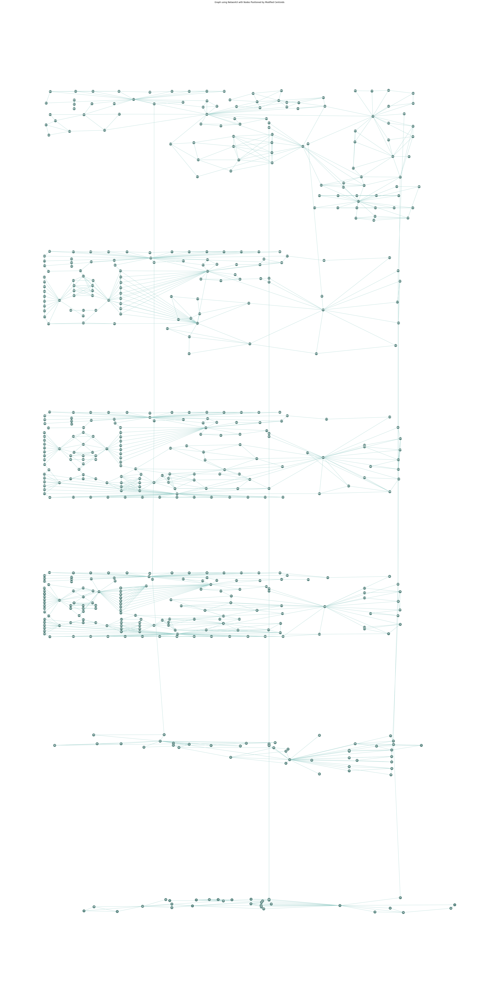

In [1]:
import csv
import os
import networkx as nx
import matplotlib.pyplot as plt
import pandas as pd
import ast  # For string-to-tuple conversion

# Aesthetics
cmap = plt.cm.jet
cmap = cmap.reversed()
cmap.set_bad('gray')

font_family = 'sans serif'
font_weight = 'bold'
font_size = '8'
edge_color = '#9BCFCA'
font_color = 'white'
node_col = '#55827D'

highlight = '#E10686'
figsize = (30, 30)
figsize_B = (40, 80)

# File Paths
directory = r"C:\Users\Georgios Bekakos\Desktop"
nodes_csv = os.path.join(directory, "nodes_final.csv")
hor_edges_csv = os.path.join(directory, "edges_final.csv")
vert_edges_csv = os.path.join(directory, "edges_vertical_final.csv")

# Read CSVs
nodes = pd.read_csv(nodes_csv)
hor_edges = pd.read_csv(hor_edges_csv)
vert_edges = pd.read_csv(vert_edges_csv)

# Rename Columns for Vertical Edges
new_column_names = {
    'Source Room Number': 'vi Room Number',
    'Target Room Number': 'vj Room Number',
    'Source Room Unique ID': 'vi Room Unique ID',
    'Target Room Unique ID': 'vj Room Unique ID'
}
vert_edges.rename(columns=new_column_names, inplace=True)
# Debugging Steps


# Concatenate Edges
edges = pd.concat([hor_edges, vert_edges], ignore_index=True)

# Extract a list of levels to use as multipliers for Y coordinates
multipliers_A = list(nodes['Level'])

# Single value for multiplication
scale = 0.1
# Multiply each integer by the multiplier
multipliers = [x * scale for x in multipliers_A]

# Convert the list of strings to a list of tuples
coordinates_strings = list(nodes['Centroid'])
coordinates_tuples = [(float(x), float(y)) for x, y in [coord.strip('()').split(',') for coord in coordinates_strings]]

# Multiply the y values by the corresponding multipliers
modified_coordinates = [(x, y * multiplier) for (x, y), multiplier in zip(coordinates_tuples, multipliers)]

# Create position dictionary based on the modified centroids
pos = {row['Index']: modified_coordinates[i] for i, (_, row) in enumerate(nodes.iterrows())}

# Create Graph from Edges and Embed Edge Info
G = nx.Graph()
for _, row in edges.iterrows():
    source = row['vi']
    target = row['vj']
    edge_attributes = row.drop(['vi', 'vj']).fillna('None').to_dict()
    G.add_edge(source, target, **edge_attributes)

# Embed Node Info
node_attributes = {}
for _, row in nodes.iterrows():
    node_id = row['Index']
    node_attributes[node_id] = row.fillna('None').to_dict()
nx.set_node_attributes(G, node_attributes)


# Step 1: Check for NaNs in DataFrames
if nodes.isnull().values.any() or edges.isnull().values.any():
    print("Warning: NaN values found in DataFrames.")
    if nodes.isnull().values.any():
        print("NaN values found in 'nodes' DataFrame:")
        for column in nodes.columns:
            nan_rows = nodes[nodes[column].isna()].index.tolist()
            if nan_rows:
                print(f"Column: {column}, Rows: {nan_rows}")
    if edges.isnull().values.any():
        print("NaN values found in 'edges' DataFrame:")
        for column in edges.columns:
            nan_rows = edges[edges[column].isna()].index.tolist()
            if nan_rows:
                print(f"Column: {column}, Rows: {nan_rows}")

# Existing Plotting Code
# ...


# Plotting
plt.figure(figsize=figsize_B)
nx.draw(G, pos, with_labels=True, node_color=node_col, font_family=font_family,
        font_weight=font_weight, font_size=font_size, edge_color=edge_color, font_color=font_color, node_size=250)
plt.title("Graph using NetworkX with Nodes Positioned by Modified Centroids")
plt.show()


# # slow

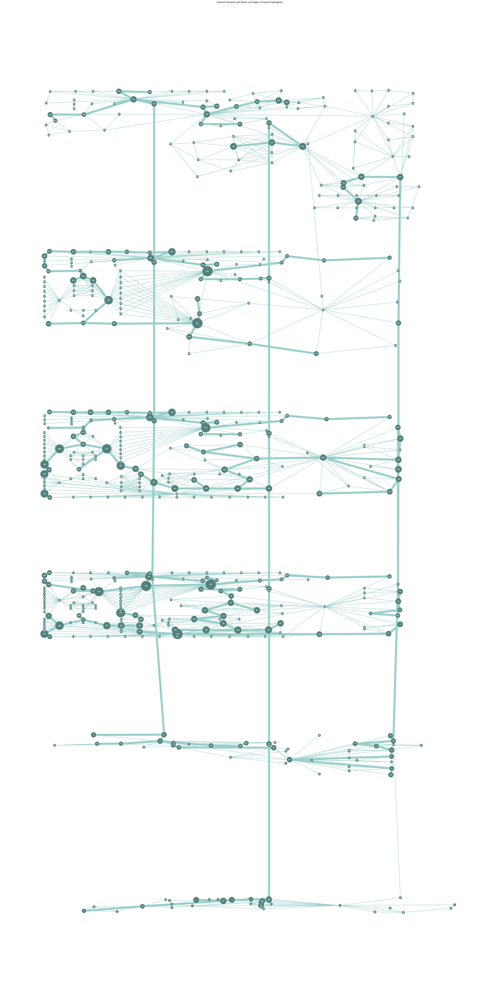

In [5]:
import csv
import os
import networkx as nx
import matplotlib.pyplot as plt
import pandas as pd
import ast

# Aesthetics
cmap = plt.cm.jet
cmap = cmap.reversed()
cmap.set_bad('gray')

font_family = 'sans serif'
font_weight = 'bold'
font_size = '8'
edge_color = '#9BCFCA'
font_color = 'white'
node_col = '#55827D'

highlight = '#E10686'
figsize = (30, 30)
figsize_B = (40, 80)

# File Paths
directory = r"C:\Users\Georgios Bekakos\Desktop"
nodes_csv = os.path.join(directory, "nodes_final.csv")
hor_edges_csv = os.path.join(directory, "edges_final.csv")
vert_edges_csv = os.path.join(directory, "edges_vertical_final.csv")

# Read CSVs
nodes = pd.read_csv(nodes_csv)
hor_edges = pd.read_csv(hor_edges_csv)
vert_edges = pd.read_csv(vert_edges_csv)

# Rename Columns for Vertical Edges
new_column_names = {
    'Source Room Number': 'vi Room Number',
    'Target Room Number': 'vj Room Number',
    'Source Room Unique ID': 'vi Room Unique ID',
    'Target Room Unique ID': 'vj Room Unique ID'
}
vert_edges.rename(columns=new_column_names, inplace=True)

# Concatenate Edges
edges = pd.concat([hor_edges, vert_edges], ignore_index=True)

# Create Position Dictionary
multipliers_A = list(nodes['Level'])
scale = 0.1
multipliers = [x * scale for x in multipliers_A]

coordinates_strings = list(nodes['Centroid'])
coordinates_tuples = [(float(x), float(y)) for x, y in [coord.strip('()').split(',') for coord in coordinates_strings]]

modified_coordinates = [(x, y * multiplier) for (x, y), multiplier in zip(coordinates_tuples, multipliers)]
pos = {row['Index']: modified_coordinates[i] for i, (_, row) in enumerate(nodes.iterrows())}

# Create Graph and Embed Edge and Node Info
G = nx.Graph()
for _, row in edges.iterrows():
    source = row['vi']
    target = row['vj']
    edge_attributes = row.drop(['vi', 'vj']).fillna('None').to_dict()
    G.add_edge(source, target, **edge_attributes)

node_attributes = {}
for _, row in nodes.iterrows():
    node_id = row['Index']
    node_attributes[node_id] = row.fillna('None').to_dict()
nx.set_node_attributes(G, node_attributes)

# Continue from where you left off:

# ... (Your existing code to import modules, read data, and create graphs remains unchanged)

# Input and constraints
input_amplifiers = [1, 4]
entrance_node = 0

# Step 1: Initialize the coherent network with the entrance node
G_coherent = nx.Graph()
G_coherent.add_node(entrance_node)

# Keep track of nodes that need to be connected to the coherent network
remaining_nodes = set(n for n, attr in G.nodes(data=True) if attr['Program Amplifier'] in input_amplifiers)

# Function to add closest node from 'remaining_nodes' to 'G_coherent'
def add_closest_node_to_coherent(G, G_coherent, remaining_nodes):
    shortest_distance = float('inf')
    closest_node = None
    start_node = None
    
    for node in G_coherent.nodes():
        for target in remaining_nodes:
            try:
                distance = nx.shortest_path_length(G, source=node, target=target, weight='Connecting Centroids Distance')
                if distance < shortest_distance:
                    shortest_distance = distance
                    closest_node = target
                    start_node = node
            except nx.NetworkXNoPath:
                continue
    
    if closest_node is not None:
        path = nx.shortest_path(G, source=start_node, target=closest_node, weight='Connecting Centroids Distance')
        for i in range(len(path) - 1):
            G_coherent.add_edge(path[i], path[i + 1])
        remaining_nodes.remove(closest_node)

# Step 2-5: Loop until all nodes with specified Program Amplifiers are part of the coherent network
while remaining_nodes:
    add_closest_node_to_coherent(G, G_coherent, remaining_nodes)

# Update node sizes and edge widths
node_sizes = [2000 * nodes.loc[nodes['Index'] == node, 'Circulation Index'].iloc[0] if node in G_coherent.nodes else 250 for node in G.nodes()]
edge_widths = [12 if edge in G_coherent.edges() else 2 for edge in G.edges()]

# Plotting
plt.figure(figsize=(40, 80))
nx.draw(G, pos, with_labels=True, node_size=node_sizes, width=edge_widths,
        font_family=font_family, font_size=font_size, font_weight=font_weight, font_color=font_color,
        node_color=node_col, edge_color=edge_color)

plt.title("Coherent Network with Nodes and Edges of Interest Highlighted")
plt.show()


# # FAST

Reached the maximum number of iterations. Exiting.


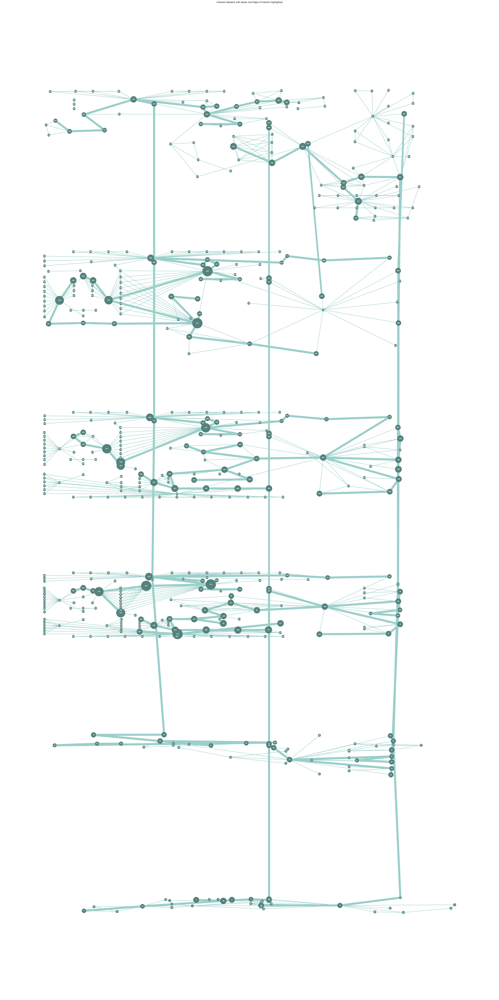

In [10]:
import csv
import os
import networkx as nx
import matplotlib.pyplot as plt
import pandas as pd
import ast

# Aesthetics
cmap = plt.cm.jet
cmap = cmap.reversed()
cmap.set_bad('gray')

font_family = 'sans serif'
font_weight = 'bold'
font_size = '8'
edge_color = '#9BCFCA'
font_color = 'white'
node_col = '#55827D'

highlight = '#E10686'
figsize = (30, 30)
figsize_B = (40, 80)

# File Paths
directory = r"C:\Users\Georgios Bekakos\Desktop"
nodes_csv = os.path.join(directory, "nodes_final.csv")
hor_edges_csv = os.path.join(directory, "edges_final.csv")
vert_edges_csv = os.path.join(directory, "edges_vertical_final.csv")

# Read CSVs
nodes = pd.read_csv(nodes_csv)
hor_edges = pd.read_csv(hor_edges_csv)
vert_edges = pd.read_csv(vert_edges_csv)

# Rename Columns for Vertical Edges
new_column_names = {
    'Source Room Number': 'vi Room Number',
    'Target Room Number': 'vj Room Number',
    'Source Room Unique ID': 'vi Room Unique ID',
    'Target Room Unique ID': 'vj Room Unique ID'
}
vert_edges.rename(columns=new_column_names, inplace=True)

# Concatenate Edges
edges = pd.concat([hor_edges, vert_edges], ignore_index=True)

# Create Position Dictionary
multipliers_A = list(nodes['Level'])
scale = 0.1
multipliers = [x * scale for x in multipliers_A]

coordinates_strings = list(nodes['Centroid'])
coordinates_tuples = [(float(x), float(y)) for x, y in [coord.strip('()').split(',') for coord in coordinates_strings]]

modified_coordinates = [(x, y * multiplier) for (x, y), multiplier in zip(coordinates_tuples, multipliers)]
pos = {row['Index']: modified_coordinates[i] for i, (_, row) in enumerate(nodes.iterrows())}

# Create Graph and Embed Edge and Node Info
G = nx.Graph()
always_include_nodes = set()  # Nodes to be always included (from vertical edges)

for idx, row in edges.iterrows():
    source = row['vi']
    target = row['vj']
    
    # Determine if the edge is from the vertical edges CSV
    is_vertical_edge = idx >= len(hor_edges)
    
    # Always include nodes connected by vertical edges
    if is_vertical_edge:
        always_include_nodes.add(source)
        always_include_nodes.add(target)

    # Only consider edges with Access = 1 or if they are from the vertical edges CSV
    if row['Access'] == 1 or is_vertical_edge:
        edge_attributes = row.drop(['vi', 'vj']).fillna('None').to_dict()
        G.add_edge(source, target, **edge_attributes)

# Always include nodes connected by vertical edges to the set of remaining nodes
remaining_nodes = set(n for n, attr in G.nodes(data=True) if 'Program Amplifier' in attr and attr['Program Amplifier'] in input_amplifiers)
remaining_nodes |= always_include_nodes

# Your existing code for setting node attributes remains unchanged
node_attributes = {}
for _, row in nodes.iterrows():
    node_id = row['Index']
    node_attributes[node_id] = row.fillna('None').to_dict()
nx.set_node_attributes(G, node_attributes)

# Always include nodes connected by vertical edges to the set of remaining nodes
remaining_nodes = (set(n for n, attr in G.nodes(data=True) if attr['Program Amplifier'] in input_amplifiers) 
                   | always_include_nodes)

# ... (Your existing code to import modules, read data, and create graphs remains unchanged)

# Function to merge clusters and add paths to coherent graph
def merge_clusters_and_add_to_coherent(G, G_coherent, clusters, closest_pairs):
    new_clusters = []
    for cluster, closest_node, start_node in closest_pairs:
        # Find which cluster closest_node belongs to
        belonging_cluster = next(c for c in clusters if closest_node in c)
        
        # Merge the two clusters
        new_cluster = cluster.union(belonging_cluster)
        
        # Remove old clusters from the list and append the new merged cluster
        if cluster in clusters: clusters.remove(cluster)
        if belonging_cluster in clusters: clusters.remove(belonging_cluster)
        
        clusters.append(new_cluster)

        # Add the shortest path to G_coherent
        path = nx.shortest_path(G, source=start_node, target=closest_node, weight='Connecting Centroids Distance')
        for i in range(len(path) - 1):
            G_coherent.add_edge(path[i], path[i + 1])
# Input and constraints
input_amplifiers = [1, 4]
entrance_node = 0

# Step 1: Initialize the coherent network with the entrance node
G_coherent = nx.Graph()
G_coherent.add_node(entrance_node)

# Keep track of nodes that need to be connected to the coherent network
remaining_nodes = set(n for n, attr in G.nodes(data=True) if attr['Program Amplifier'] in input_amplifiers)

# Initialize clusters with each node as a single-node cluster
clusters = [{node} for node in remaining_nodes | {entrance_node}]

# Step 2-5: Loop until all nodes are part of the coherent network or escape if not possible
iterations = 0  # Counter to avoid infinite loops
max_iterations = 3000  # Set a maximum number of iterations

while len(clusters) > 1 and iterations < max_iterations:
    closest_pairs = []

    for cluster in clusters:
        shortest_distance = float('inf')
        closest_node, start_node = None, None

        for node in cluster:
            for target in remaining_nodes - cluster:
                try:
                    distance = nx.shortest_path_length(G, source=node, target=target, weight='Connecting Centroids Distance')
                    if distance < shortest_distance:
                        shortest_distance = distance
                        closest_node = target
                        start_node = node
                except nx.NetworkXNoPath:
                    continue

        if closest_node is not None:
            closest_pairs.append((cluster, closest_node, start_node))

    # Merge clusters and add paths to coherent graph
    merge_clusters_and_add_to_coherent(G, G_coherent, clusters, closest_pairs)
    
    iterations += 1  # Increment the counter

# Check for escape condition
if iterations >= max_iterations:
    print("Reached the maximum number of iterations. Exiting.")

# Update node sizes and edge widths
node_sizes = []
for node in G.nodes():
    if node in G_coherent.nodes:
        size = 2000 * nodes.loc[nodes['Index'] == node, 'Circulation Index'].iloc[0]
    elif node in always_include_nodes:
        size = 1000  # Size for nodes connected by vertical edges
    else:
        size = 250
    node_sizes.append(size)

edge_widths = []
for edge in G.edges():
    if edge in G_coherent.edges():
        width = 12
    elif edge[0] in always_include_nodes and edge[1] in always_include_nodes:
        width = 10  # Width for vertical edges
    else:
        width = 2
    edge_widths.append(width)

# Plotting
plt.figure(figsize=(40, 80))
nx.draw(G, pos, with_labels=True, node_size=node_sizes, width=edge_widths,
        font_family=font_family, font_size=font_size, font_weight=font_weight, font_color=font_color,
        node_color=node_col, edge_color=edge_color)

plt.title("Coherent Network with Nodes and Edges of Interest Highlighted")
plt.show()


# # FASTER

Reached the maximum number of iterations. Exiting.


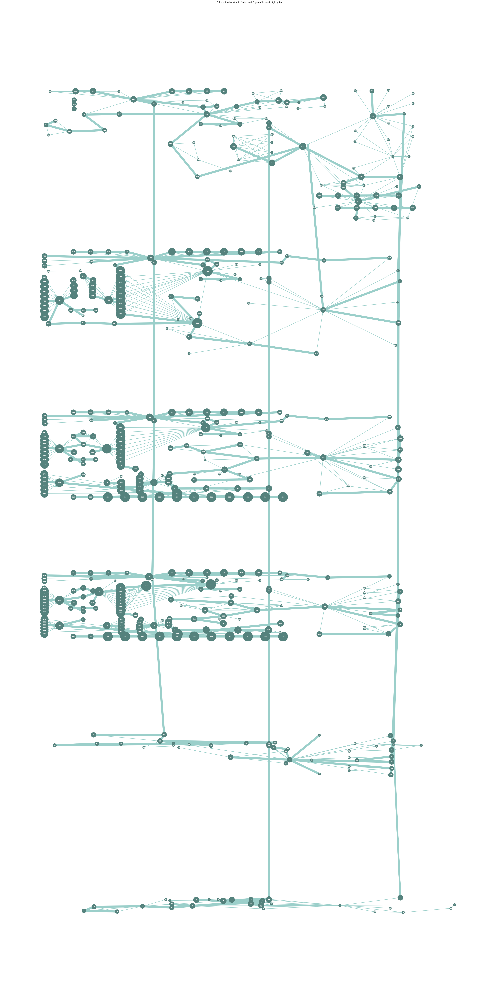

In [13]:
import csv
import os
import networkx as nx
import matplotlib.pyplot as plt
import pandas as pd
import ast

# Aesthetics
cmap = plt.cm.jet
cmap = cmap.reversed()
cmap.set_bad('gray')

font_family = 'sans serif'
font_weight = 'bold'
font_size = '8'
edge_color = '#9BCFCA'
font_color = 'white'
node_col = '#55827D'

highlight = '#E10686'
figsize = (30, 30)
figsize_B = (40, 80)

# File Paths
directory = r"C:\Users\Georgios Bekakos\Desktop"
nodes_csv = os.path.join(directory, "nodes_final.csv")
hor_edges_csv = os.path.join(directory, "edges_final.csv")
vert_edges_csv = os.path.join(directory, "edges_vertical_final.csv")

# Read CSVs
nodes = pd.read_csv(nodes_csv)
hor_edges = pd.read_csv(hor_edges_csv)
vert_edges = pd.read_csv(vert_edges_csv)

# Rename Columns for Vertical Edges
new_column_names = {
    'Source Room Number': 'vi Room Number',
    'Target Room Number': 'vj Room Number',
    'Source Room Unique ID': 'vi Room Unique ID',
    'Target Room Unique ID': 'vj Room Unique ID'
}
vert_edges.rename(columns=new_column_names, inplace=True)

# Concatenate Edges
edges = pd.concat([hor_edges, vert_edges], ignore_index=True)

# Create Position Dictionary
multipliers_A = list(nodes['Level'])
scale = 0.1
multipliers = [x * scale for x in multipliers_A]

coordinates_strings = list(nodes['Centroid'])
coordinates_tuples = [(float(x), float(y)) for x, y in [coord.strip('()').split(',') for coord in coordinates_strings]]

modified_coordinates = [(x, y * multiplier) for (x, y), multiplier in zip(coordinates_tuples, multipliers)]
pos = {row['Index']: modified_coordinates[i] for i, (_, row) in enumerate(nodes.iterrows())}

# Create Graph and Embed Edge and Node Info
G = nx.Graph()
always_include_nodes = set()  # Nodes to be always included (from vertical edges)

for idx, row in edges.iterrows():
    source = row['vi']
    target = row['vj']
    
    # Determine if the edge is from the vertical edges CSV
    is_vertical_edge = idx >= len(hor_edges)
    
    # Always include nodes connected by vertical edges
    if is_vertical_edge:
        always_include_nodes.add(source)
        always_include_nodes.add(target)

    # Only consider edges with Access = 1 or if they are from the vertical edges CSV
    if row['Access'] == 1 or is_vertical_edge:
        edge_attributes = row.drop(['vi', 'vj']).fillna('None').to_dict()
        G.add_edge(source, target, **edge_attributes)

# Always include nodes connected by vertical edges to the set of remaining nodes
remaining_nodes = set(n for n, attr in G.nodes(data=True) if 'Program Amplifier' in attr and attr['Program Amplifier'] in input_amplifiers)
remaining_nodes |= always_include_nodes

# Your existing code for setting node attributes remains unchanged
node_attributes = {}
for _, row in nodes.iterrows():
    node_id = row['Index']
    node_attributes[node_id] = row.fillna('None').to_dict()
nx.set_node_attributes(G, node_attributes)

# Always include nodes connected by vertical edges to the set of remaining nodes
remaining_nodes = (set(n for n, attr in G.nodes(data=True) if attr['Program Amplifier'] in input_amplifiers) 
                   | always_include_nodes)

# ... (Your existing code to import modules, read data, and create graphs remains unchanged)

# Function to merge clusters and add paths to coherent graph
def merge_clusters_and_add_to_coherent(G, G_coherent, clusters, closest_pairs):
    new_clusters = []
    for cluster, closest_node, start_node in closest_pairs:
        # Find which cluster closest_node belongs to
        belonging_cluster = next(c for c in clusters if closest_node in c)
        
        # Merge the two clusters
        new_cluster = cluster.union(belonging_cluster)
        
        # Remove old clusters from the list and append the new merged cluster
        if cluster in clusters: clusters.remove(cluster)
        if belonging_cluster in clusters: clusters.remove(belonging_cluster)
        
        clusters.append(new_cluster)

        # Add the shortest path to G_coherent
        path = nx.shortest_path(G, source=start_node, target=closest_node, weight='Connecting Centroids Distance')
        for i in range(len(path) - 1):
            G_coherent.add_edge(path[i], path[i + 1])
# Input and constraints
input_amplifiers = [1, 2, 3, 4, 5]
entrance_node = 0

# Step 1: Initialize the coherent network with the entrance node
G_coherent = nx.Graph()
G_coherent.add_node(entrance_node)

# Keep track of nodes that need to be connected to the coherent network
remaining_nodes = set(n for n, attr in G.nodes(data=True) if attr['Program Amplifier'] in input_amplifiers)

# Initialize clusters with each node as a single-node cluster
clusters = [{node} for node in remaining_nodes | {entrance_node}]

# Pre-calculate shortest paths and their lengths for quicker access
shortest_paths = {}
shortest_path_lengths = {}
for source in G.nodes():
    shortest_paths[source] = nx.single_source_dijkstra_path(G, source=source, weight='Connecting Centroids Distance')
    shortest_path_lengths[source] = nx.single_source_dijkstra_path_length(G, source=source, weight='Connecting Centroids Distance')

# Initialize clusters with each node as a single-node cluster
clusters = [{node} for node in remaining_nodes | {entrance_node}]

# Initialize
iterations = 0
max_iterations = 3000

while len(clusters) > 1 and iterations < max_iterations:
    closest_pairs = []

    for cluster in clusters:
        shortest_distance = float('inf')
        closest_node, start_node = None, None

        for node in cluster:
            for target in remaining_nodes - cluster:
                try:
                    distance = shortest_path_lengths[node].get(target, float('inf'))
                    if distance < shortest_distance:
                        shortest_distance = distance
                        closest_node = target
                        start_node = node
                except KeyError:
                    continue

        if closest_node is not None:
            closest_pairs.append((cluster, closest_node, start_node))

    # Merge clusters and add paths to coherent graph
    merge_clusters_and_add_to_coherent(G, G_coherent, clusters, closest_pairs)
    
    iterations += 1

# Check for escape condition
if iterations >= max_iterations:
    print("Reached the maximum number of iterations. Exiting.")

# Update node sizes and edge widths
node_sizes = []
for node in G.nodes():
    if node in G_coherent.nodes:
        size = 2000 * nodes.loc[nodes['Index'] == node, 'Circulation Index'].iloc[0]
    elif node in always_include_nodes:
        size = 1000  # Size for nodes connected by vertical edges
    else:
        size = 250
    node_sizes.append(size)

edge_widths = []
for edge in G.edges():
    if edge in G_coherent.edges():
        width = 12
    elif edge[0] in always_include_nodes and edge[1] in always_include_nodes:
        width = 10  # Width for vertical edges
    else:
        width = 2
    edge_widths.append(width)

# Plotting
plt.figure(figsize=(40, 80))
nx.draw(G, pos, with_labels=True, node_size=node_sizes, width=edge_widths,
        font_family=font_family, font_size=font_size, font_weight=font_weight, font_color=font_color,
        node_color=node_col, edge_color=edge_color)

plt.title("Coherent Network with Nodes and Edges of Interest Highlighted")
plt.show()


# # Minimum Spanning Tree

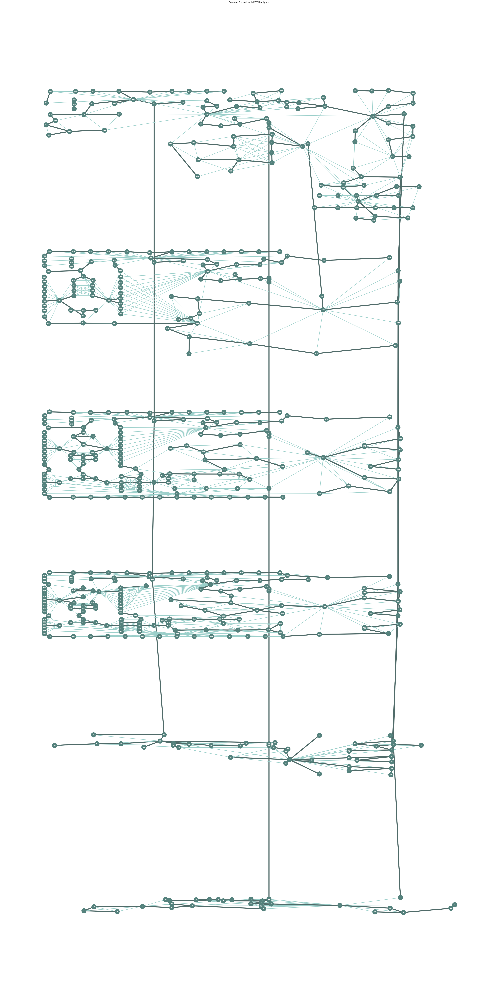

In [20]:
import csv
import os
import networkx as nx
import matplotlib.pyplot as plt
import pandas as pd
import ast

# Aesthetics
cmap = plt.cm.jet
cmap = cmap.reversed()
cmap.set_bad('gray')
font_family = 'sans serif'
font_weight = 'bold'
font_size = '8'
edge_color = '#9BCFCA'
font_color = 'white'
node_col = '#55827D'
highlight = '#E10686'
figsize = (30, 30)
figsize_B = (40, 80)

# File Paths
directory = r"C:\Users\Georgios Bekakos\Desktop"
nodes_csv = os.path.join(directory, "nodes_final.csv")
hor_edges_csv = os.path.join(directory, "edges_final.csv")
vert_edges_csv = os.path.join(directory, "edges_vertical_final.csv")

# Read CSVs
nodes = pd.read_csv(nodes_csv)
hor_edges = pd.read_csv(hor_edges_csv)
vert_edges = pd.read_csv(vert_edges_csv)

# Rename Columns for Vertical Edges
new_column_names = {'Source Room Number': 'vi Room Number', 'Target Room Number': 'vj Room Number', 'Source Room Unique ID': 'vi Room Unique ID', 'Target Room Unique ID': 'vj Room Unique ID'}
vert_edges.rename(columns=new_column_names, inplace=True)

# Concatenate Edges
edges = pd.concat([hor_edges, vert_edges], ignore_index=True)

# Create Position Dictionary
multipliers_A = list(nodes['Level'])
scale = 0.1
multipliers = [x * scale for x in multipliers_A]

coordinates_strings = list(nodes['Centroid'])
coordinates_tuples = [(float(x), float(y)) for x, y in [coord.strip('()').split(',') for coord in coordinates_strings]]

modified_coordinates = [(x, y * multiplier) for (x, y), multiplier in zip(coordinates_tuples, multipliers)]
pos = {row['Index']: modified_coordinates[i] for i, (_, row) in enumerate(nodes.iterrows())}

# Create Graph and Embed Edge and Node Info
G = nx.Graph()

# Add edges based on your conditions
for idx, row in edges.iterrows():
    source = row['vi']
    target = row['vj']
    edge_attributes = row.drop(['vi', 'vj']).fillna('None').to_dict()
    G.add_edge(source, target, **edge_attributes)

# Add node attributes
node_attributes = {}
for _, row in nodes.iterrows():
    node_id = row['Index']
    node_attributes[node_id] = row.fillna('None').to_dict()
nx.set_node_attributes(G, node_attributes)

# Generate MST
MST = nx.minimum_spanning_tree(G, algorithm='kruskal', weight='Connecting Centroids Distance')

# Define Node and Edge styles for G
node_sizes = [800 for node in G.nodes]

edge_colors = ['#506b69' if edge in MST.edges() else edge_color for edge in G.edges]
edge_widths = [6 if edge in MST.edges() else 2 for edge in G.edges]

# Plotting
plt.figure(figsize=(40, 80))

# Draw original graph
nx.draw(G, pos, with_labels=True,
        node_color=node_col, node_size=node_sizes,
        edge_color=edge_colors, width=edge_widths,
        font_family=font_family, font_size=font_size, font_weight=font_weight, font_color=font_color)

plt.title("Coherent Network with MST Highlighted")
plt.show()


In [22]:
import csv
import os

# Define the path to your desktop
desktop_path = "C:\\Users\\Georgios Bekakos\\Desktop"

# Define the filenames for the node and edge CSV files
node_file = os.path.join(desktop_path, "nodes_final.csv")
edge_file = os.path.join(desktop_path, "edges_final.csv")

# Read node feature columns from the node CSV file
with open(node_file, 'r') as f:
    reader = csv.reader(f)
    node_columns = next(reader)

# Exclude any columns you don't want from node_columns, for example, the node ID
node_columns = [col for col in node_columns if col.lower() != 'id']

# General agent attributes
agent_attributes = [
    "ID",
    "Agent_Type",
    "Current_Node",
    "Schedule",
    "Preferences",
    "Status",
    "Visited_Nodes",
    "Energy_Level",
    "Personality",
    "Occupation_Type",
    "Target_Rooms",
    "Current_Goal",
    "Hours",
    "Social_Circle"
]

# Combine general and specific attributes
all_attributes = agent_attributes + node_columns

# Initialize empty list to hold agent data
agents = []

# Generate sample data for 3 agents: 1 student, 1 academic, 1 staff
for i, agent_type in enumerate(["Student", "Academic", "Staff"], 1):
    agent_data = {
        "ID": i,
        "Agent_Type": agent_type,
        "Current_Node": f"Node_{i}",
        "Schedule": f"Schedule_{i}",
        "Preferences": f"Preferences_{i}",
        "Status": "Idle",
        "Visited_Nodes": "",
        "Energy_Level": 100,
        "Personality": "Introverted" if i == 1 else "Extroverted",
        "Occupation_Type": agent_type,
        "Target_Rooms": f"Target_Rooms_{i}",
        "Current_Goal": f"Goal_{i}",
        "Hours": f"Hours_{i}",
        "Social_Circle": f"Social_Circle_{i}"
    }

    # Add node-specific features
    for feature in node_columns:
        agent_data[feature] = 0  # Initialize to zero; you can update these based on your data
    
    agents.append(agent_data)

# Write to CSV
output_file = os.path.join(desktop_path, "parameterized_agents.csv")
with open(output_file, 'w', newline='') as csvfile:
    writer = csv.DictWriter(csvfile, fieldnames=all_attributes)
    writer.writeheader()
    for agent in agents:
        writer.writerow(agent)

print("CSV created successfully!")


CSV created successfully!
